In [1]:
%pip install --user seaborn

You are using pip version 19.0.3, however version 21.1.3 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import yaml
import shutil
import uuid
from tensorflow.keras import backend as K
from nn_tools import read_count
import tensorflow as tf
from data_bank import data_selector
import model_builders as mb
import os
from os.path import join
import matplotlib.pyplot as plt
import sys
from adversarial_attacks.spsa import spsa, spsa_T1
from adversarial_attacks.df_attacks import attack_network
from tensorflow.keras.applications.resnet50 import preprocess_input as res_prep
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg_prep
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.metrics import SparseCategoricalAccuracy

In [3]:
from Demo_evaluate_network import print_certainty_vs_distance_table
import math
from scipy.special import softmax
import seaborn as sns

In [4]:
def inv_logit(x):
    
    y = np.zeros(2)
    
    y = softmax(x)
    
    return y


In [5]:
#Setup model

tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
configfile = 'config_conf_mat.yml'

with open(configfile) as ymlfile:
    cgf = yaml.load(ymlfile, Loader =yaml.SafeLoader)

# Set up computational resource 
os.environ["CUDA_VISIBLE_DEVICES"]= str(cgf['COMPUTER_SETUP']['compute_node'])

# Turn on soft memory allocation
tf_config = tf.compat.v1.ConfigProto()
tf_config.gpu_options.allow_growth = True
tf_config.log_device_placement = False
sess = tf.compat.v1.Session(config=tf_config)
#K.v1.set_session(sess)

In [6]:
%%time
data_loader = data_selector(cgf['DATASET']['name'], cgf['DATASET']['arguments'])

data, labels, diff = data_loader.load_data() 

CPU times: user 463 µs, sys: 1.95 s, total: 1.95 s
Wall time: 1.96 s


In [7]:
data = data[:3000,:,:]
labels = labels[:3000]

'''
data = np.load(cgf["DATASET"]["arguments"]["images"])
labels = np.load(cgf["DATASET"]["arguments"]["labels"])
'''

'\ndata = np.load(cgf["DATASET"]["arguments"]["images"])\nlabels = np.load(cgf["DATASET"]["arguments"]["labels"])\n'

In [8]:
# Get input and output shape
input_shape = data.shape[1:]
#output_shape = labels.shape[1];
print('input_shape', input_shape)
# Set the default precision 
model_precision = cgf['MODEL_METADATA']['precision']
K.set_floatx(model_precision)

model_id = cgf['MODEL_METADATA']['model_number_arguments']['model_id']
model_path = join('model', str(model_id))
filepath = cgf['MODEL_METADATA']['save_best_model']['arguments']['filepath']
attack = cgf['ATTACK']['name']

#original_data = cgf['DATASET']['arguments']['original_images']
#bels = cgf['DATASET']['arguments']['labels']

weights_path = join(model_path, filepath)

optimizer = cgf['TRAIN']['optim']['type']
loss_type = cgf['TRAIN']['loss']['type']
metric_list = list(cgf['TRAIN']['metrics'].values())

if loss_type == 'SparseCategoricalCrossentropy':
    loss_type = SparseCategoricalCrossentropy(from_logits=False)
    metric_list = [SparseCategoricalAccuracy()]
    output_shape = 2
    labels = np.reshape(labels, (-1))

model_name = cgf['MODEL']['name']
model_arguments = cgf['MODEL']['arguments']
#model = mb.model_selector(model_name, input_shape, output_shape, model_arguments)

model = tf.keras.models.load_model(weights_path)

# Preprocessing
if model_name =='resnet':
    preprocessing = res_prep
    data = 255*data
    data = data - 122
    labels = np.reshape(labels,(-1))
    #data = tf.cast(data, dtype=tf.float32)
    #labels = tf.cast(data, dtype=tf.float32)
elif model_name == 'vgg16':
    preprocessing = vgg_prep
    data = 255*data
    data = data - 122
    labels = np.reshape(labels,(-1))
    #data = tf.cast(data, dtype=tf.float32)
    #labels = tf.cast(data, dtype=tf.float32)
else:
    preprocessing = None 
    data = 255*data
    data = data - 122
    data = np.expand_dims(data, axis = 3)

model.compile(optimizer=optimizer,
              loss=loss_type,
              metrics = metric_list)

model.trainable = False

input_shape (224, 224, 1)


In [9]:
len(data)

3000

In [10]:
data_loader = data_selector(cgf['DATASET']['name'], cgf['DATASET']['train_arguments'])

data_train, labels_train, diff_train = data_loader.load_data()

# Preprocessing
if model_name =='resnet':
    preprocessing = res_prep
    data_train = 255*data_train
    data_train = data_train-122
    #data = tf.cast(data, dtype=tf.float32)
    #labels = tf.cast(data, dtype=tf.float32)
elif model_name == 'vgg16':
    preprocessing = vgg_prep
    data_train = 255*data_train
    data_train = data_train - 122
    #data = tf.cast(data, dtype=tf.float32)
    #labels = tf.cast(data, dtype=tf.float32)
else:
    preprocessing = None 
    data_train = 255*data_train
    data_train = data_train - 122
    data_train = np.expand_dims(data_train, axis = 3)

# Evaluate the model on training data (can also do on test)

# Evaluate the model on the test data using `evaluate`
print("Evaluate on data")
results = model.evaluate(tf.convert_to_tensor(data), tf.convert_to_tensor(labels), batch_size=1)
print("Loss :{}, Accuracy: {}%.".format(results[0], results[1]))

Evaluate on data
3000/3000 [==============================] - 645s 215ms/step - loss: 2.2070 - sparse_categorical_accuracy: 0.8590
Loss :2.2070200379899956, Accuracy: 0.859%.


In [11]:
predictions = model.predict(tf.convert_to_tensor(data))

In [12]:
for i in range(len(predictions)):
    predictions[i] = inv_logit(predictions[i])

In [13]:
matrix = print_certainty_vs_distance_table(10,10, predictions[:,1],diff)

                                                                 Network certainty
Distance boundary [  0,  10]   [ 10,  20]   [ 20,  30]   [ 30,  40]   [ 40,  50]   [ 50,  60]   [ 60,  70]   [ 70,  80]   [ 80,  90]   [ 90, 100]   
[  0.00,  10.00]:      276          1            0            0            0            0            0            0            2            9       
[ 10.00,  20.00]:      274          0            0            0            0            0            0            0            0            24      
[ 20.00,  30.00]:      290          1            0            1            0            1            1            0            0            32      
[ 30.00,  40.00]:      153          1            2            2            0            1            0            1            2            89      
[ 40.00,  50.00]:      74           2            1            1            1            0            1            0            2            235     
[ 50.00,  60.00]:      

Text(33.0, 0.5, 'Distance to the decision boundary')

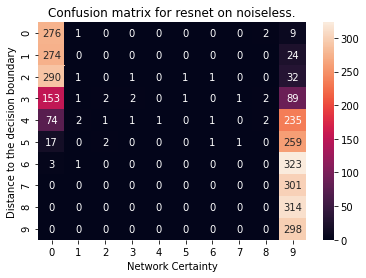

In [14]:
noise_type = 'noiseless'

sns.heatmap(matrix,annot=True, fmt='.20g')
plt.title('Confusion matrix for {} on {}.'.format(cgf['MODEL']['name'], noise_type))
plt.xlabel('Network Certainty')
plt.ylabel('Distance to the decision boundary')

                                                                 Network certainty
Distance boundary [  0,  10]   [ 10,  20]   [ 20,  30]   [ 30,  40]   [ 40,  50]   [ 50,  60]   [ 60,  70]   [ 70,  80]   [ 80,  90]   [ 90, 100]   
[  0.00,  10.00]:      182          0            1            0            0            0            1            1            0            16      
[ 10.00,  20.00]:      176          0            0            1            0            0            0            0            0            5       
[ 20.00,  30.00]:      168          0            1            0            0            0            1            0            1            28      
[ 30.00,  40.00]:      139          2            1            0            2            0            2            0            2            65      
[ 40.00,  50.00]:      41           1            1            2            0            1            1            0            1            151     
[ 50.00,  60.00]:      

Text(33.0, 0.5, 'Distance to the decision boundary')

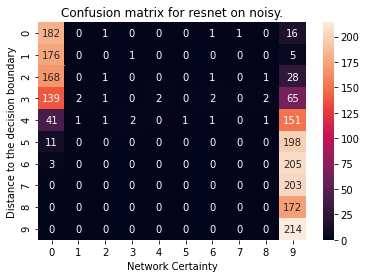

In [15]:
predictions = model.predict(tf.convert_to_tensor(data_train))
for i in range(len(predictions)):
    predictions[i] = inv_logit(predictions[i])
matrix = print_certainty_vs_distance_table(10,10, predictions[:,1],diff_train)
noise_type = 'noisy'

sns.heatmap(matrix,annot=True, fmt='.20g')
plt.title('Confusion matrix for {} on {}.'.format(cgf['MODEL']['name'], noise_type))
plt.xlabel('Network Certainty')
plt.ylabel('Distance to the decision boundary')

In [16]:
print("Evaluate on data")
results = model.evaluate(tf.convert_to_tensor(data), tf.convert_to_tensor(labels), batch_size=50)
print("Loss :{}, Accuracy: {}%.".format(results[0], results[1]))

Evaluate on data
60/60 [==============================] - 105s 2s/step - loss: 2.2070 - sparse_categorical_accuracy: 0.8590
Loss :2.2070199718077976, Accuracy: 0.859%.


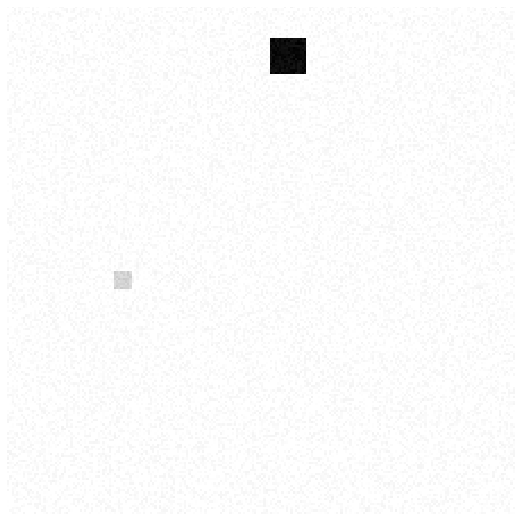

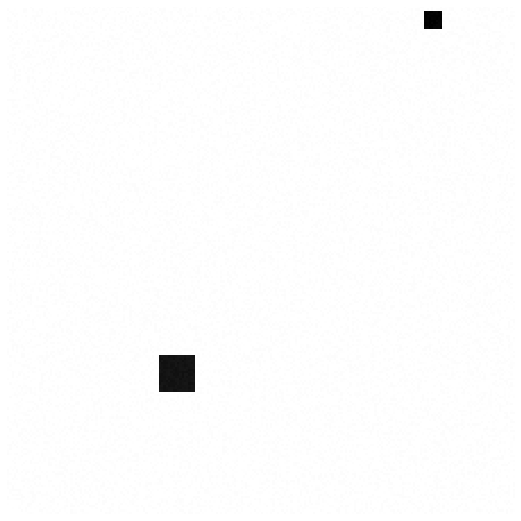

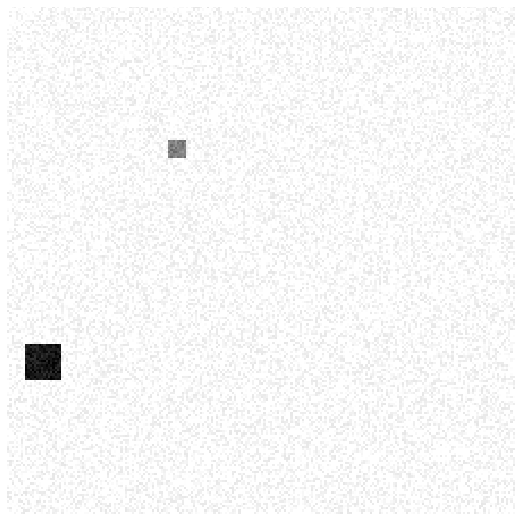

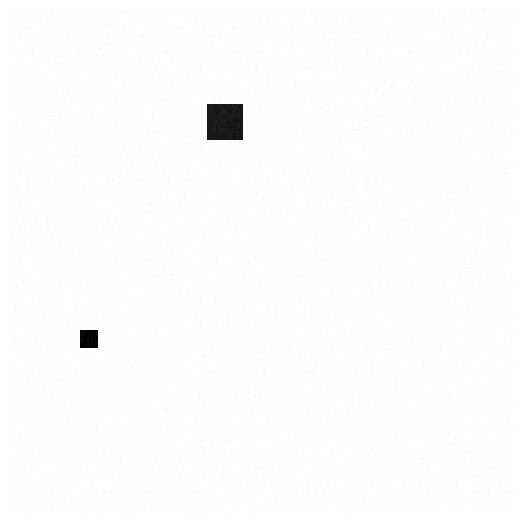

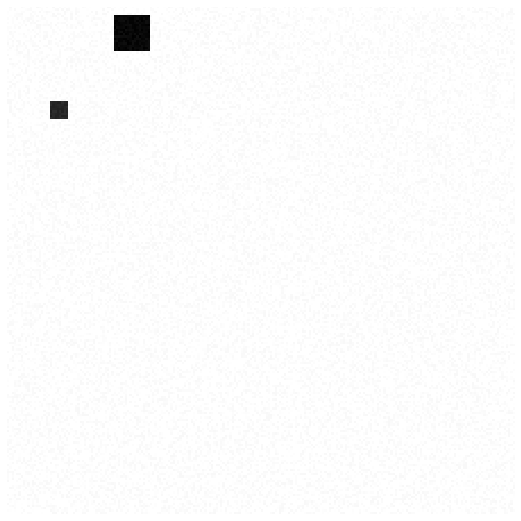

...

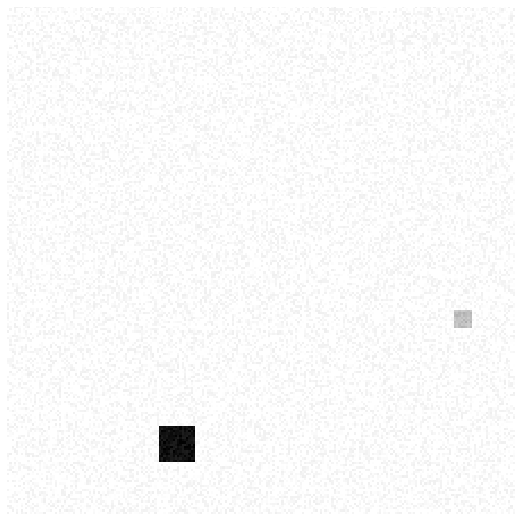

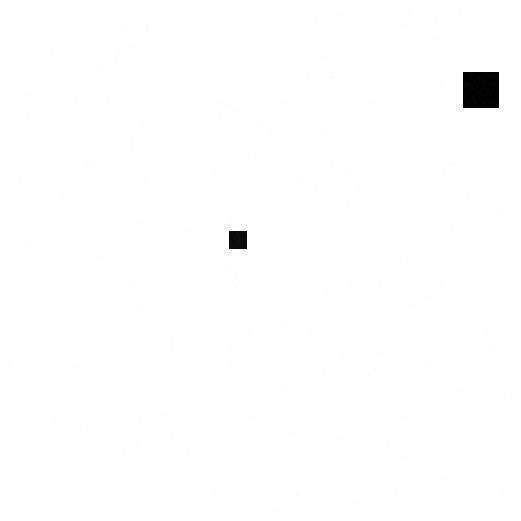

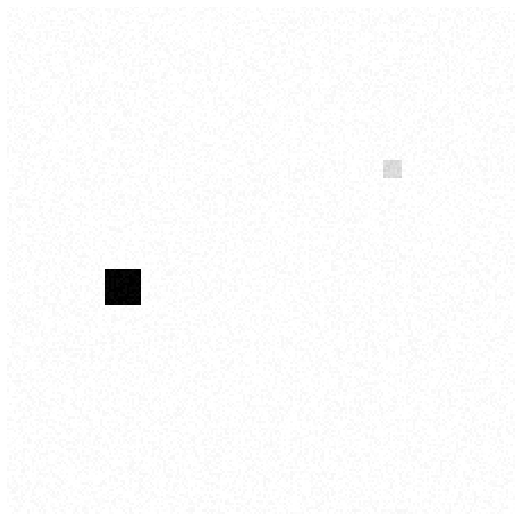

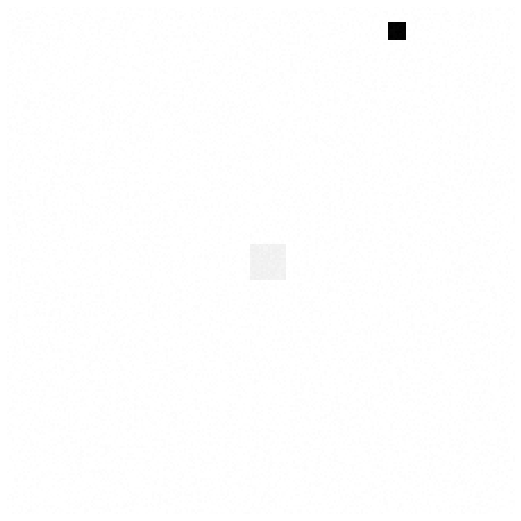

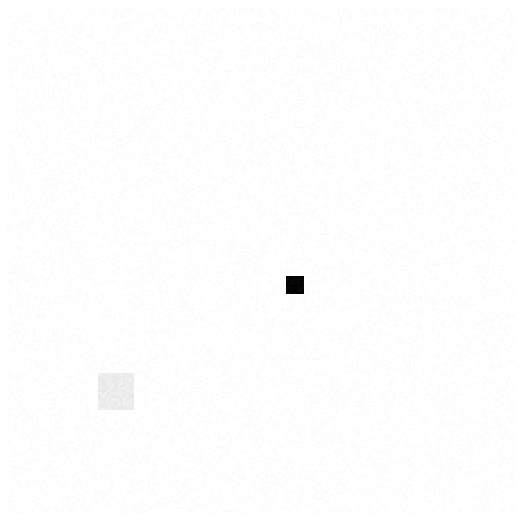

In [17]:

for i in range(300):
    plt.figure(figsize=(20,10))

    plt.subplot(122)
    plt.matshow(data[i], cmap = 'gray', fignum=False)
    plt.axis('off')

    plt.show()

# Compare loss 

In [18]:
print("Evaluate on data")
results1 = model.evaluate(tf.convert_to_tensor(data), tf.convert_to_tensor(labels), batch_size=1)
print("Loss :{}, Accuracy: {}%.".format(results1[0], results1[1]))

Evaluate on data
3000/3000 [==============================] - 649s 216ms/step - loss: 2.2070 - sparse_categorical_accuracy: 0.8590
Loss :2.2070200379899956, Accuracy: 0.859%.


In [19]:
y_pred = model.predict(tf.convert_to_tensor(data))

#for i in range(len(y_pred)):
#    y_pred[i] = inv_logit(y_pred[i])

In [20]:
y_theoretical = np.zeros((3000,2))
y_theoretical[:,0] = np.ones(3000) - diff[:3000]
y_theoretical[:,1] = diff[:3000]

y_theoretical = np.log(y_theoretical)

In [21]:
y_true = labels

In [22]:
scce = SparseCategoricalCrossentropy(from_logits = True)
print(scce(y_true, y_pred).numpy())
print(scce(y_true, y_theoretical).numpy())

5.817500114440918
0.30677202343940735


In [23]:
weird = np.ones((3000,2)) * 0.5

In [24]:
print(scce(y_true, weird).numpy())

0.6931471228599548
